# **Abstract**

In this project, we analyse the dataset of [Coffee Sales](https://www.kaggle.com/datasets/keremkarayaz/coffee-shop-sales) of a coffe shop chain in the US in Kaggle public datasets. We perform exploratory data analysis (EDA) and the demand forecasting for the Coffee Shop which is valuable for a potential product portfolio optimization. Several techniques from data analysis, statistics and pure mathematics are leveraged in the process, demonstrating the beauty of interplay between abstract and computational mathematics. The key result of our analysis is that the demand increases by 102.53% in 6 months.

# **1. Introduction**

Market demand analysis is the process of understanding and estimating the level of demand for a product or service in a target market. It helps businesses and organizations make informed decisions about production, pricing, marketing, and overall strategy. By conducting market demand analysis, businesses can better predict customer needs, reduce risks, and optimize their strategies for growth.

We are interested in applying market demand analysis for a coffee shop chain in the US based on their [sales dataset](https://www.kaggle.com/datasets/keremkarayaz/coffee-shop-sales) from January 2023 to June 2023 which is available in Kaggle public dataset.

In [1]:
# Libraries
# Libraries:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from IPython.display import HTML, Markdown

mpl.style.use("seaborn-v0_8-bright")
import warnings
warnings.filterwarnings('ignore')

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
coffee_sales = pd.read_excel("/kaggle/input/coffee-shop-sales/Coffee Shop Sales.xlsx")

/kaggle/input/coffee-shop-sales/Coffee Shop Sales.xlsx


# **2. Methodology**

We will execute this project in a systematic steps presented as follows:

1.   Load the Coffee Sales dataset.
2.   Preprocessing the dataset.
3.   Statisitical analysis for the market demand analysis.
4.   Implementation of machine learning (ML) for the market demand forecast.

# **3. Data Processing**

The coffee sales dataset is loaded in the following cell. And the first 5 rows of the dataset are as displayed below.

In [2]:
coffee_sales.head()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


The description regarding the column names in the dataset above is presented as follows:

- `transaction_id`: the transaction id.
- `transaction_date`: the transaction date.
- `transaction_quantity`: the quantity of products in the transaction.
- `store_id`: the store id.
- `store_location`: the store location.
- `product_id`: the product id.
- `unit_price`: the unit price of the product in USD.
- `product_category`: the category of the product.
- `product_type`: the product type.
- `product_detail`: the detail of the product.

The further basic information regarding the dataset is presented in the following cell:

In [3]:
display(coffee_sales.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 12.5+ MB


None

In [4]:
pd.DataFrame(
    coffee_sales.isnull().sum(),
    columns= ["Number of Missing Values"]
    ).T

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
Number of Missing Values,0,0,0,0,0,0,0,0,0,0,0


In [5]:
pd.DataFrame(coffee_sales.nunique(), columns= ["Number of Unique Values"]).T

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
Number of Unique Values,149116,181,25762,6,3,3,80,41,9,29,80


# **4. Market Demand Analysis**

## **4.1. Exploratory Data Analysis**

### **4.1.1. Sales Distribution by Product Category**

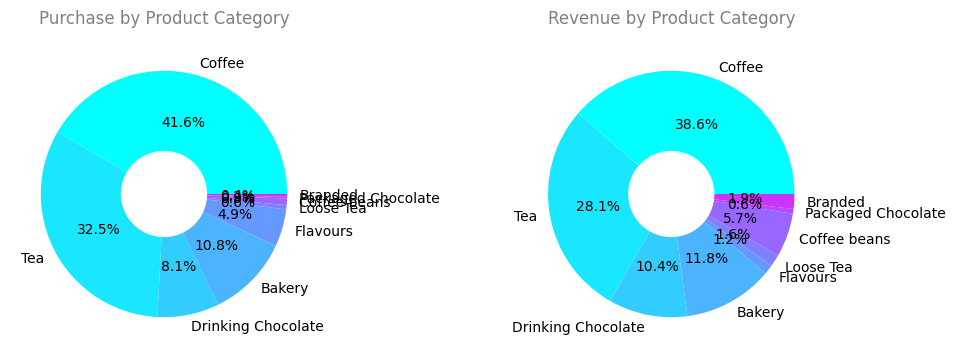

In [6]:
def sales_dist_by_cat(figsize= (12, 4)):
    df = coffee_sales.copy()
    freq = {
        prod: df[df["product_category"] == prod]["transaction_qty"].sum()
        for prod in df["product_category"].unique()
    }
    revenue = {
        prod: np.dot(df[df["product_category"] == prod]["unit_price"],
            df[df["product_category"] == prod]["transaction_qty"])
        for prod in df["product_category"].unique()
    }

    fig, axs = plt.subplots(nrows= 1, ncols= 2, figsize= figsize)

    # First donut chart:
    don1 = axs[0]
    don1.pie(
        freq.values(),
        labels= freq.keys(),
        autopct= "%1.1f%%",
        colors= [
                plt.cm.cool(k / (len(freq) + 1))
                for k in range(len(freq))]
    )
    cir1 = plt.Circle((0, 0), 0.35, fc= "white")
    don1.add_patch(cir1)
    axs[0].set_title(
        "Purchase by Product Category",
        color= "gray",
        pad= 12
    )

    # Second donut chart:
    don2 = axs[1]
    don2.pie(
        revenue.values(),
        labels= revenue.keys(),
        autopct= "%1.1f%%",
        colors= [
                plt.cm.cool(k / (len(freq) + 1))
                for k in range(len(freq))]
    )
    cir2 = plt.Circle((0, 0), 0.35, fc= "white")
    don2.add_patch(cir2)
    axs[1].set_title(
        "Revenue by Product Category",
        color= "gray",
        pad= 12
    )

    fig = plt.show()

sales_dist_by_cat()

### **4.1.2. Purchase Distribution for Each Product Category**

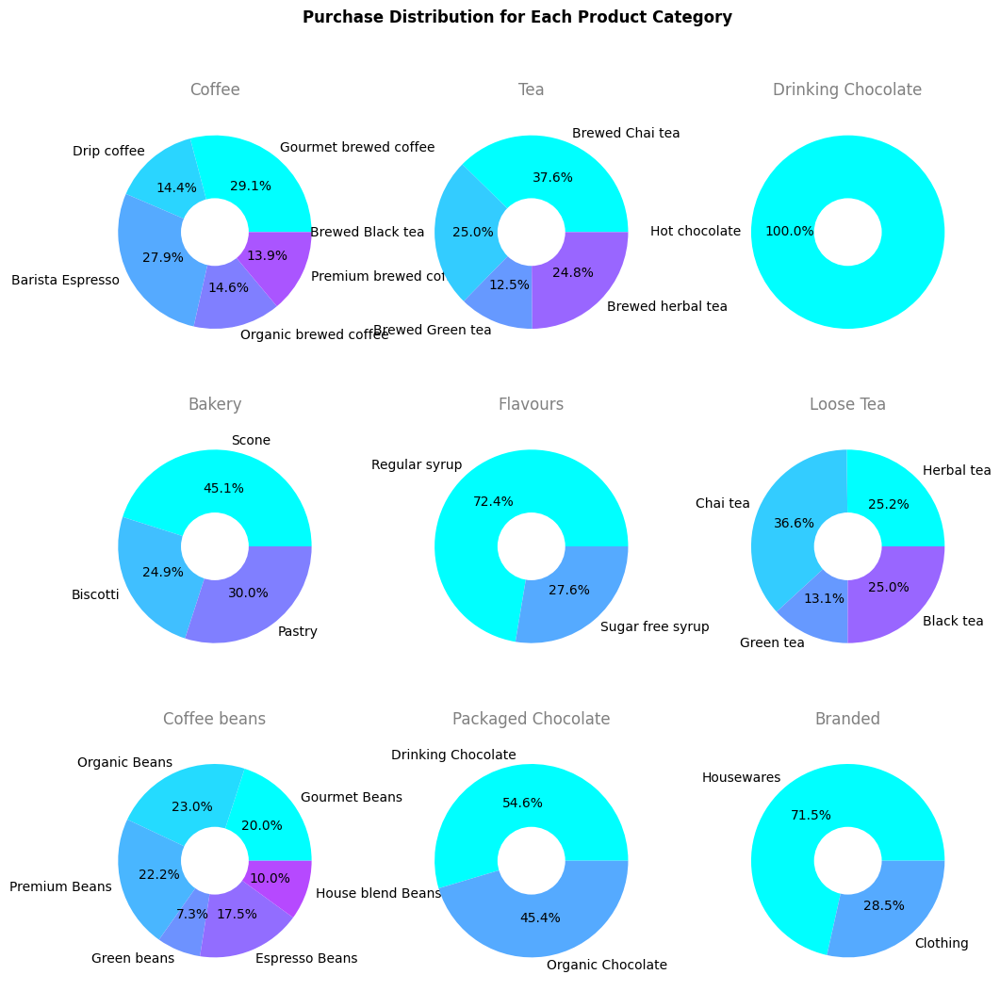

In [7]:
def sales_dist_each_cat(figsize= (12, 12)):
    df = coffee_sales.copy()
    fig, axs = plt.subplots(nrows= 3, ncols= 3, figsize= figsize)
    for k, prod in zip(
            range(df["product_category"].nunique()),
            df["product_category"].unique()
            ):
        i, j = divmod(k, 3)
        don = axs[i][j]
        values = [
            df[df["product_type"] == ptype]["transaction_qty"].sum()
            for ptype in df[
                df["product_category"] == prod
                ]["product_type"].unique()
        ]
        labels = df[df["product_category"] == prod]["product_type"].unique()
        don.pie(
            values,
            labels= labels,
            autopct= "%1.1f%%",
            colors= [
                    plt.cm.cool(k / (len(labels) + 1))
                    for k in range(len(labels))]
        )
        cir = plt.Circle((0, 0), 0.35, fc= "white")
        don.add_patch(cir)
        axs[i][j].set_title(
            f"{prod}",
            color= "gray",
            pad= 12
        )
    fig = plt.subplots_adjust(hspace= 0.3, wspace= 0.3)
    fig = plt.suptitle(
        "Purchase Distribution for Each Product Category",
        y= 0.97,
        weight= "bold"
    )
    fig = plt.show()

sales_dist_each_cat()

### **4.1.3. Revenue Distribution for Each Product Category**

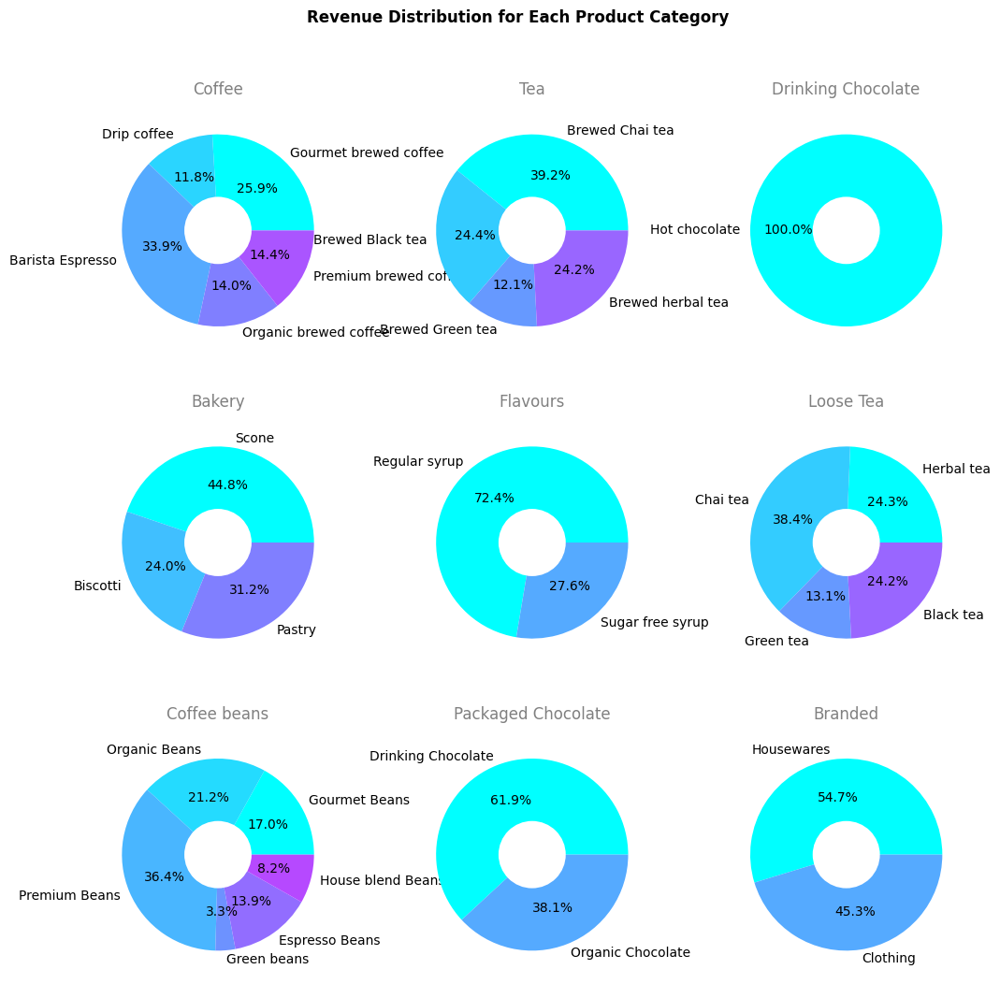

In [8]:
def rev_dist_each_cat(figsize= (12, 12)):
    df = coffee_sales.copy()
    fig, axs = plt.subplots(nrows= 3, ncols= 3, figsize= figsize)
    for k, prod in zip(
            range(df["product_category"].nunique()),
            df["product_category"].unique()
            ):
        i, j = divmod(k, 3)
        don = axs[i][j]
        values = [
            np.dot(
                df[df["product_type"] == ptype]["transaction_qty"],
                df[df["product_type"] == ptype]["unit_price"]
            )
            for ptype in df[
                df["product_category"] == prod
                ]["product_type"].unique()
        ]
        labels = df[df["product_category"] == prod]["product_type"].unique()
        don.pie(
            values,
            labels= labels,
            autopct= "%1.1f%%",
            colors= [
                    plt.cm.cool(k / (len(labels) + 1))
                    for k in range(len(labels))]
        )
        cir = plt.Circle((0, 0), 0.35, fc= "white")
        don.add_patch(cir)
        axs[i][j].set_title(
            f"{prod}",
            color= "gray",
            pad= 12
        )
    fig = plt.subplots_adjust(hspace= 0.3, wspace= 0.3)
    fig = plt.suptitle(
        "Revenue Distribution for Each Product Category",
        y= 0.97,
        weight= "bold"
    )
    fig = plt.show()

rev_dist_each_cat()

### **4.1.4. Total Product Sales**

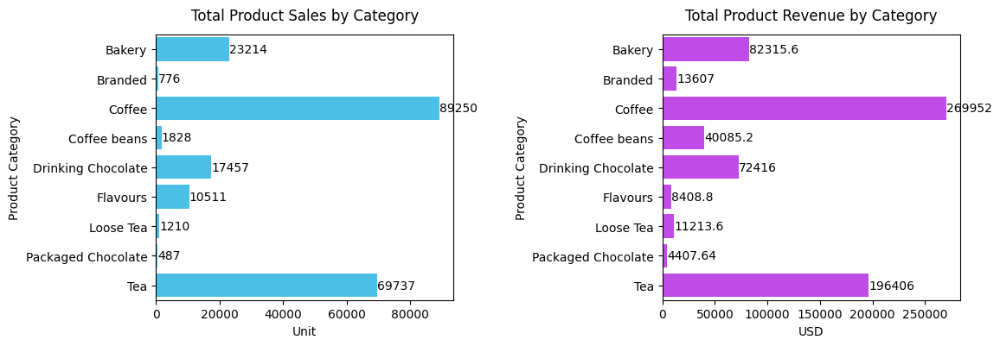

In [9]:
def measure_product_sales(figsize= (12, 4)):
    df = coffee_sales.copy()
    df["revenue"] = df["transaction_qty"] *df["unit_price"]
    fig, axs = plt.subplots(nrows= 1, ncols= 2, figsize= figsize)
    fig = sns.barplot(
        x= "transaction_qty",
        y= "product_category",
        data= df.groupby("product_category")["transaction_qty"].sum().reset_index(),
        errorbar= None,
        color= plt.cm.cool(0.2),
        ax= axs[0]
    )
    axs[0].set_title(
        "Total Product Sales by Category",
        pad= 12
    )
    axs[0].set(xlabel= "Unit", ylabel= "Product Category")
    axs[0].bar_label(
            axs[0].containers[0],
            fontsize= 10
        )

    fig = sns.barplot(
        x= "revenue",
        y= "product_category",
        data= df.groupby("product_category")["revenue"].sum().reset_index(),
        errorbar= None,
        color= plt.cm.cool(0.8),
        ax= axs[1]
    )
    axs[1].set_title(
        "Total Product Revenue by Category",
        pad= 12
    )
    axs[1].set(xlabel= "USD", ylabel= "Product Category")
    axs[1].bar_label(
            axs[1].containers[0],
            fontsize= 10
        )

    fig = plt.subplots_adjust(wspace= 0.7)
    fig = plt.show()

measure_product_sales()

### **4.1.5. Historical Product Sales**

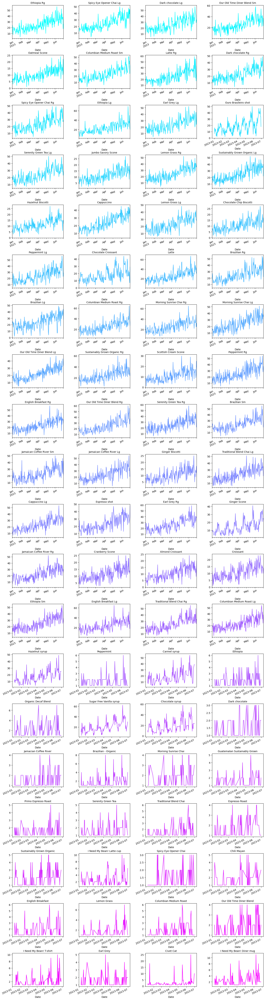

In [10]:
def hist_product_sales(revenue= False, figsize= (18, 4 *20)):
    df = coffee_sales.copy()
    df["revenue"] = df["transaction_qty"] *df["unit_price"]
    if revenue == False:
        col = "transaction_qty"
    else:
        col = "revenue"
    fig, axs = plt.subplots(
        nrows= 20,
        ncols= 4,
        figsize= figsize
    )
    products = df["product_detail"].unique()
    for k, prod in zip(range(len(products)), products):
        i, j = divmod(k, 4)
        dat = df[df["product_detail"] == prod].copy()
        dat = dat.reset_index(drop= True)
        ts = pd.DataFrame(
            {
                "date": dat["transaction_date"].unique(),
                prod: [
                    dat[dat["transaction_date"] == d][col].sum()
                    for d in dat["transaction_date"].unique()
                ]
            }
        )
        fig = ts.set_index("date").plot(
            color= plt.cm.cool(k / (len(products) + 1)),
            ax= axs[i][j],
            legend= False,
            rot= 24,
            xlabel= "Date"
        )
        axs[i][j].set_title(
            f"{prod}",
            fontsize= 10
        )
    fig = plt.subplots_adjust(hspace= 0.5, wspace= 0.3)
    fig = plt.show()

hist_product_sales()

### **4.1.6. Historical Product Revenue**

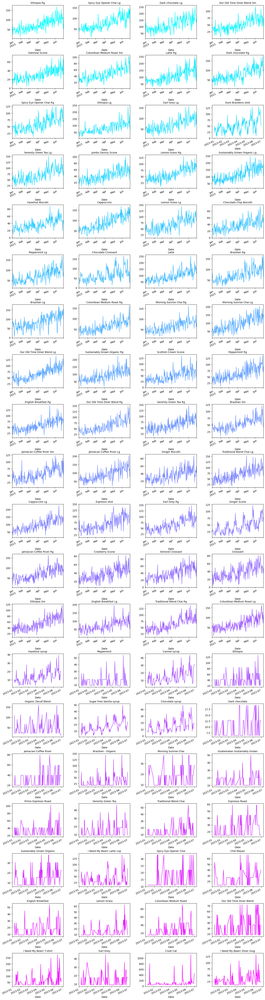

In [11]:
hist_product_sales(revenue= True)

### **4.1.7. Historical Price**

In [12]:
def th_price():
    df = coffee_sales.copy()
    dfs_dict = dict()

    for prod in df["product_detail"].unique():
        prices = tuple(df[df["product_detail"] == prod]["unit_price"].unique())
        dfs_dict[prod] = prices

    return pd.DataFrame(
        {
            "Product": dfs_dict.keys(),
            "Unit Prices": dfs_dict.values()
        }
    )

display(Markdown(
"""
It is important to evaluate whether there are some price changes for each product. The evaluation is presented as follows:
"""
))
display(th_price())
display(Markdown(
"""
It is confirmed that several products underwent price changes. The price changes are prices increase.
"""
))


It is important to evaluate whether there are some price changes for each product. The evaluation is presented as follows:


,Product,Unit Prices
0,Ethiopia Rg,"(3.0,)"
1,Spicy Eye Opener Chai Lg,"(3.1,)"
2,Dark chocolate Lg,"(4.5,)"
3,Our Old Time Diner Blend Sm,"(2.0,)"
4,Oatmeal Scone,"(3.0,)"
...,...,...
75,Our Old Time Diner Blend,"(18.0,)"
76,I Need My Bean! T-shirt,"(28.0, 23.0)"
77,Earl Grey,"(8.95,)"
78,Civet Cat,"(45.0,)"



It is confirmed that several products underwent price changes. The price changes are prices increase.


## **4.2. Market Demand Analysis and Forecast**

Now we perform the market demand analysis. Based on the dataset of the coffee sales as well as the EDA that we have performed earlier, we will now build a mathematical model for the coffee sales by leveraging measure theory [1] and probability theory [2]. We decide incorporating formal mathematical theory to make the comptational process much more systematic and rigorous, ensuring a solid foundation in the theorical framework.

### **4.2.1. Measurable Space of Products**

We define a set $\Omega$ of all products in the dataset, specifically, values in the column `product_detail`.
The set $\Omega$ can be referred to as a *sample space* [2], especially in the context of probability. Now suppose a family $\mathcal{F}$ of subsets of $\Omega$ such that $\mathcal{F}$ is a $\sigma$-algebra [1]. Now we have a measurable space $(\Omega, \mathcal{F})$ [1]. Then we can assign any measure [1] on $(\Omega, \mathcal{F})$ including a probability measure [2] or any other necessary measure.

In this project, we designate $(\Omega, \mathcal{F})$ to be a discrete measurable space, meaning that $\mathcal{F} = \mathcal{P}(\Omega)$.

### **4.2.2. Sales Analysis and Models**

#### **Sales Time Series**

Let $T$ be the set consisting of dates started from the first date in the dataset to the date far ahead the dataset. We designate that $T$ is homeomorphic [3] to $\mathbb{N}$. If $\tilde{T}$ is the set of unique dates in the dataset, then $\tilde{T} \subset T$. And let $\mathcal{T} := \mathcal{P}(T)$, which is a discrete $\sigma$-algebra [1] on $T$. And thus, we have a measurable space $(T, \mathcal{T})$. We can also build a measurable space on $\tilde{T}$ which is also a measurable subspace of $(T, \mathcal{T})$ by defining a $\sigma$-algebra
$$
\tilde{\mathcal{T} } := \{ A \in \mathcal{T} \mid \exists B \in \mathcal{T} [A = \tilde{T} \cap B] \}
$$
on $\tilde{T}$ which is also a sub-$\sigma$-algebra of $\mathcal{T}$ [1]. Thus, we also have a measurable subspace $(\tilde{T}, \tilde{\mathcal{T}})$ of $(T, \mathcal{T})$.

Suppose a probability measure [2] $P_T: \mathcal{T} \to [0, 1]$ on $(T, \mathcal{T})$. Hence, we have a probability space $(T, \mathcal{T}, P_T)$. The time series of sales with respect to the products are given by a family of maps $\{Y_\omega\}_{\omega \in \Omega} \subset L^2(P_T)$ [1][2]. Follows from our assumption that our model will only capture the trend and a possible seasonality, then there exists some families $\{Y_{\omega, 1}\}_{\omega \in \Omega}, \{Y_{\omega, 2}\}_{\omega \in \Omega}, \{\varepsilon_{\omega}\}_{\omega \in \Omega}$ of bounded everywhere [1] functions representing trends, seasonalities and residuals respectively such that
$$
\forall \omega \in \Omega \forall t \in T :\;
Y_{\omega}(t) = Y_{\omega, 1}(t) + Y_{\omega, 2}(t) + \varepsilon_\omega(t)
$$
Since $P_T$ is a finite measure [1], then
$$
\forall \omega \in \Omega :\;
Y_{\omega, 1}, Y_{\omega, 2}, \varepsilon_\omega \in L^2(P_T) \,.
$$
And consequently, $\{Y_\omega\}_{\omega \in \Omega} \subset L^2(P_T)$ [1] and furthermore, every member in this family is also bounded everywhere.

Our forecast model is given by a family of maps $\{\hat{Y}_\omega\}_{\omega \in \Omega}$ defined by
$$
\forall \omega \in \Omega \forall t \in T :\;
\hat{Y}_\omega(t)
= \alpha_{\omega} + Y_{\omega, 1}(t) + Y_{\omega, 2}(t)
\,.
$$
Thus, $\{\hat{Y}_\omega\}_{\omega \in \Omega} \subset L^2(P_T)$ [1] and furthermore, every member in this family is also bounded everywhere.

To capture all the values in the data for our forecast model, we propose to impose an additional condition. First, let us define a counting measure $\kappa: \tilde{T} \to \mathbb{N}$ by
$$
\forall S \in \tilde{\mathcal{T}} :\;
\kappa(S) = |S| \,.
$$
Note that we already have a measurable space $(\tilde{T}, \tilde{\mathcal{T}})$ which is a subspace of $(T, \mathcal{T})$. And $\kappa(\tilde{T}) < \infty$ since there are finitely many datapoints in the dataset.

Since all functions in $\{Y_{\omega, 1}\}_{\omega \in \Omega}, \{Y_{\omega, 2}\}_{\omega \in \Omega}, \{\varepsilon_\omega\}_{\omega \in \Omega}, \{Y_\omega\}_{\omega \in \Omega}, \{\hat{Y}_\omega\}_{\omega \in \Omega}$ are bounded everywhere, then $\{Y_{\omega, 1}\}_{\omega \in \Omega}, \{Y_{\omega, 2}\}_{\omega \in \Omega}, \{\varepsilon_\omega\}_{\omega \in \Omega}, \{Y_\omega\}_{\omega \in \Omega}, \{\hat{Y}_\omega\}_{\omega \in \Omega} \subset L^2(\kappa)$. And the condition is given by
$$
\forall \omega \in \Omega :\;
\int_{\tilde{T}} Y_\omega \,\mathrm{d}\kappa
= \int_{\tilde{T}} \hat{Y}_\omega \,\mathrm{d}\kappa
\,,
$$
which will referred to as the Lebesgue integral equality (LIE) condition for the further discussion.

Let us now define a probability measure on $(\tilde{T}, \tilde{\mathcal{T}})$ by $P_{\tilde{T}}: \tilde{\mathcal{T}} \to [0, 1]$ by
$$
\forall S \in \tilde{\mathcal{T}} :\;
P_\tilde{T}(S) := \frac{\kappa(S)}{\kappa(\tilde{T})} \,.
$$
Note that $P_\tilde{\mathcal{T}} \ll \kappa$ [1]. And we can also exprees
$$
\forall S \in \tilde{\mathcal{T}} :\;
P_\tilde{T}(S)
= \frac{1}{\kappa(\tilde{T})} \int_\tilde{S} \,\mathrm{d}\kappa \,.
$$
And hence, $\frac{1}{\kappa(\tilde{T})}$ is the Radon-Nikodym derivative [1] of $P_\tilde{T}$ with respect to $\kappa$, i.e., $\frac{\mathrm{d} P_\tilde{T}}{\mathrm{d} \kappa} = \frac{1}{\kappa(\tilde{T})}$. Follows from the LIE condition, we can also have
\begin{align*}
\int_{\tilde{T}} Y_\omega \,\mathrm{d}\kappa
&= \int_{\tilde{T}} \hat{Y}_\omega \,\mathrm{d}\kappa \\
\frac{1}{\kappa(\tilde{T})} \int_{\tilde{T}} Y_\omega \,\mathrm{d}\kappa
&= \frac{1}{\kappa(\tilde{T})}
\int_{\tilde{T}} \hat{Y}_\omega \,\mathrm{d}\kappa \\
\int_{\tilde{T}} Y_\omega \frac{\mathrm{d} P_\tilde{T}}{\mathrm{d} \kappa} \,\mathrm{d}\kappa
&= \int_{\tilde{T}} \hat{Y}_\omega \frac{\mathrm{d} P_\tilde{T}}{\mathrm{d} \kappa}\,\mathrm{d}\kappa \\
\int_{\tilde{T}} Y_\omega \,\mathrm{d}P_\tilde{T}
&= \int_{\tilde{T}} \hat{Y}_\omega \,\mathrm{d}P_\tilde{T} \\
\mathrm{E}[Y_\omega]
&= \mathrm{E}[\hat{Y}_\omega]
\end{align*}
for every $\omega \in \Omega$. This is an equivalent statement for the LIE condition.

#### **Sales Trends**

**Topology on $\tilde{T}$**

We will now first define a topology [3] $\tilde{\mathcal{U}}$ on $\tilde{T}$. We have mentioned that $T$ is designated to be homeomorphic [3] to $\mathbb{N}$. Then, let $h: T \to \mathbb{N}$ be the homeomorphism [3]. We indeed have not explicitly mention the topology on $T$. We will work out defining a topology $\mathcal{U}$ on $T$ from the homeomorphic nature of $T$ with respect to $\mathbb{N}$. Let $h: T \to \mathbb{N}$ be the homeomorphism. Let $\mathcal{E}$ be the topology on $\mathbb{N}$ which can be constructed from a subbase [3]
$$
\mathcal{B} = \{[0, m) \in \mathcal{P}(\mathbb{N}) \mid m \in \mathbb{N}\}
\cup \{(n, \infty) \in \mathcal{P}(\mathbb{N}) \mid n \in \mathbb{N}\}
$$
in which the rule of interval for $\mathbb{N}$ is described by
$$
\forall x, y \in \mathbb{R}[
    x < y
    \implies
    (x, y) = \{n \in \mathbb{N} \mid x < n < y \}
] \,.
$$
By making use of the homeomorphism $h$, we can define
$$
\mathcal{U} := \{U \in \mathcal{P}(T) \mid \exists E \in \mathcal{E}[U = h^{-1}(E)]\} \,.
$$
And we define
$$
\tilde{\mathcal{U}} := \{U \in \tilde{\mathcal{T}} \mid \exists S \in \mathcal{U}[U = \tilde{T} \cap S]\} \,.
$$
Note that $(\tilde{T}, \tilde{\mathcal{U}})$ is a subspace of $(T, \mathcal{U})$. And note that $(\mathbb{N}, \mathcal{E})$ is metrizable, and so are $(T, \mathcal{U})$ and $(\tilde{T}, \tilde{\mathcal{U}})$. In this setting, we can define an open ball operator
\begin{align*}
B: (0, \infty) \times T &\to \mathcal{U} \\
(r, t) &\mapsto B_r(t)
\end{align*}
by
$$
\forall r > 0 \forall t \in T :\;
B_r(t) := \{ u \in T \mid t - r < u < t + r \} = (t - r, t + r) \,.
$$
Note that the operator $B$ also applies to $(\tilde{T})$ the same way since $\tilde{\mathcal{U}}$ is a subspace of $\mathcal{U}$. Let us recall that $\mathcal{T}$ is the discrete $\sigma$-algebra on $T$, and $\tilde{\mathcal{T}}$ is a subspace and is also the discrete $\sigma$-algebra on $\tilde{T}$. Hence, every open set in $\mathcal{U}$ is $\mathcal{T}$-measurable, and likewise, every open set in $\tilde{U}$ is $\tilde{\mathcal{T}}$-measurable.

**Moving Average**

We will now construct the moving average map
\begin{align*}
\mathrm{ma}: (0, \infty) \times \tilde{T} \times L^2(P_{\tilde{T}}) &\to \mathbb{R} \\
(r, t, f) &\mapsto \mathrm{ma}_{r, f}(t)
\end{align*}
by
$$
\forall r > 0 \forall t \in \tilde{T} \forall f \in L^2(P_\tilde{T}) :\;
\mathrm{E}[ f \mid B_r(t) ]
$$
where $\mathrm{E}[\;\cdot\mid\cdot\;]: \mathcal{L}^0(\tilde{T}, \tilde{\mathcal{T}}) \times \tilde{\mathcal{T}} \to \mathbb{R}$ is the conditional expecation and $\mathcal{L}^0(\tilde{T}, \tilde{\mathcal{T}})$ is the set of all $\tilde{\mathcal{T}}$-measurable functions.

**Norm of Residuals**

Let $f \in L^2(P_\tilde{T})$. The norm of residual with respect to $f$ can be given by a map $\|\cdot\|_f: L^2(P_\tilde{T}) \to [0, \infty)$ defined by
$$
\forall g \in L^2(P_\tilde{T}) :\;
\|g\|_f := \left( \int_{\tilde{T}} (f - \mathrm{E}[f])^2 \,\mathrm{d}P_\tilde{T} \right)^{-1/2}
\left( \int_{\tilde{T}} (f - g)^2 \,\mathrm{d}P_\tilde{T} \right)^{1/2}
$$

**Construction of $\{Y_{\omega, 1}\}_{\omega \in \Omega}$**

The trend is constructed to be a function minimizing the norm of residual with respect to the moving average of the time series. As mentioned earlier, we will define the trends as lienar trends for simplicity. Hence, we have
$$
\forall \omega \in \Omega \forall t \in T :\;
Y_{\omega, 1}(t) = \beta_{\omega, 0} + \beta_{\omega, 1} t
$$
for some $\beta_{\omega, 0}, \beta_{\omega, 1} \in \mathbb{R}$.

In the computational process, we will determine each in $\{Y_{\omega, 1}\}_{\omega \in \Omega}$ using `LinearRegression` from `sklearn.linear_model`. This algorithm uses the Ordinary Least Square (OLS) to minimize the residuals in order to determine $(\beta_0, \beta_1)$. However, we will monitor the norm of residulas by computing $\|Y_{\omega, 1}\|_{\mathrm{ma}_{r, Y_\omega}}$.

The computation is conducted as follows.

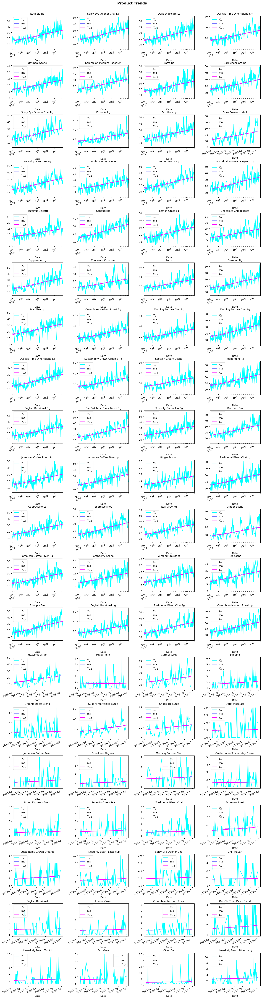

,product,Norm of Residuals,Trend Coefficients
0,Ethiopia Rg,0.142715,"(14.562279576683633, 0.10608013180977144)"
1,Spicy Eye Opener Chai Lg,0.135578,"(14.82821214110273, 0.1038338360794831)"
2,Dark chocolate Lg,0.134949,"(16.139786381410453, 0.10536850769608604)"
3,Our Old Time Diner Blend Sm,0.155691,"(14.752951469380859, 0.10923428943764626)"
4,Oatmeal Scone,0.139221,"(6.164577557995403, 0.042463245405246874)"
...,...,...,...
75,Our Old Time Diner Blend,0.248142,"(1.5998612923677977, 0.0035027436728950474)"
76,I Need My Bean! T-shirt,0.404354,"(2.0761165519705678, 0.00512261764949013)"
77,Earl Grey,0.562159,"(1.6020515378912046, 0.0009609209775150279)"
78,Civet Cat,0.447542,"(2.2979770874661547, 0.007790498246766568)"


In [13]:
def norm_of_residuals(X, Y):
    A, B = np.array(X), np.array(Y)
    EA = np.mean(A)
    norm = np.linalg.norm
    return norm(A - B) / norm(A - EA)

def trend_computation(r= 60):
    df = coffee_sales.copy()
    col = "transaction_qty"
    ma_dict = dict()
    nres_dict = dict()
    betas_dict = dict()

    for prod in df["product_detail"].unique():
        dat = df[df["product_detail"] == prod].copy()
        dat = dat.reset_index(drop= True)
        ts = pd.DataFrame(
            {
                "date": dat["transaction_date"].unique(),
                prod: [
                    dat[dat["transaction_date"] == d][col].sum()
                    for d in dat["transaction_date"].unique()
                ]
            }
        )
        ma = list()
        for t in range(len(ts)):
            if t - r < 0:
                a = 0
                b = t + r
            elif t + r > len(ts):
                a = t - r
                b = len(ts)
            else:
                a = t - r
                b = t + r
            ma.append(np.array(ts[prod])[a:b].mean())

        ma_df = pd.DataFrame(
            {"date": ts["date"], r"$Y_\omega$": ts[prod], r"$\mathrm{ma}$": ma}
        )

        X = pd.DataFrame({"const": [1] *len(ma_df), "T": ma_df.index})

        model = LinearRegression(fit_intercept= False)
        _ = model.fit(X, ma)
        b0, b1 = model.coef_

        ma_df[r"$Y_{\omega, 1}$"] = model.predict(X)
        # func = lambda t: b0 + b1 *t
        # ma_df[r"$Y_{\omega, 1}$"] = [func(t) for t in ma_df.index]

        betas_dict[prod] = (b0, b1)
        nres_dict[prod] = norm_of_residuals(ma, model.predict(X))

        ma_dict[prod] = ma_df.copy()

    func_info = pd.DataFrame(
        {
            "product": nres_dict.keys(),
            "Norm of Residuals": nres_dict.values(),
            "Trend Coefficients": betas_dict.values()
            }
    )

    return ma_dict, func_info

trend_results = trend_computation()

def visualize_trends(figsize= (18, 4 *20)):
    products = coffee_sales["product_detail"].unique()
    dfs_dict = dict()
    for prod in products:
        dfs_dict[prod] = trend_results[0][prod]

    fig, axs = plt.subplots(
        nrows= 20,
        ncols= 4,
        figsize= figsize
    )
    for k, prod in zip(range(len(products)), products):
        i, j = divmod(k, 4)
        df = dfs_dict[prod].copy()
        fig = df.set_index("date").plot(
            cmap= "cool",
            rot= 24,
            xlabel= "Date",
            ax= axs[i][j],
            )
        axs[i][j].set_title(
            f"{prod}",
            fontsize= 10
        )
    fig = plt.subplots_adjust(hspace= 0.5, wspace= 0.3)
    fig = plt.suptitle(
        "Product Trends",
        y= 0.89,
        weight= "bold",
        fontsize= 14
        )
    fig = plt.show()

visualize_trends()
print("\n")
display(trend_results[1])

#### **Sales Seasonality**

To capture the seasonal component of the product time series, we will incorporate sinusoidal functions. The seasonality components $\{Y_{\omega, 2}\}_{\omega \in \Omega}$ will take the form
$$
\forall \omega \in \Omega \forall t \in T :\;
Y_{\omega, 2}(t) = \sum_{k = 0}^{N_\omega} a_{\omega, k} \sin\left( \frac{2 \pi k t}{M_\omega} \right) + b_{\omega, k} \cos\left( \frac{2 \pi k t}{M_\omega} \right)
$$
where $\{a_{\omega, 0}, \dotsc, a_{\omega, N_\omega}\}_{\omega \in \Omega}, \{b_{\omega, 0}, \dotsc, b_{\omega, N_\omega}\}_{\omega \in \Omega} \subset \mathbb{R}$ and $\{M_\omega\}_{\omega \in \Omega}, \{N_\omega\}_{\omega \in \Omega} \subset \mathbb{N}$. The number $M_\omega$ represents the period of $Y_{\omega, 2}$, for every $\omega \in \Omega$.

We will again employ `LinearRegression` from `sklearn.linear_model` to determine $\{a_{\omega, 0}, \dotsc, a_{\omega, N_\omega}\}_{\omega \in \Omega}, \{b_{\omega, 0}, \dotsc, b_{\omega, N_\omega}\}_{\omega \in \Omega} \subset \mathbb{R}$. But we need the machine learning model to be validated on an unseen dataset this time. So we will partition $\tilde{T}$ into $\tilde{T}_t, \tilde{T}_v$ such that
$$
\tilde{T} = \tilde{T}_t \cup \tilde{T}_v
\;\land\;
\tilde{T}_t \cap \tilde{T}_v = \varnothing \,.
$$
The set $\tilde{T}_t$ will represent the training dataset while $\tilde{T}_v$ will represent the validation dataset. Note that $\tilde{T}_t, \tilde{T}_v \in \tilde{\mathcal{T}}$ since $\tilde{\mathcal{T}}$ is a discrete $\sigma$-algebra.

We will train a linear regression model on $\tilde{T}_t$ in which the model will employ OLS to find the coefficients. The numbers in $\{M_\omega\}_{\omega \in \Omega} \subset \mathbb{N}$ will first be determined from observing the conditional correlation of $Y_\omega - Y_{\omega, 1}$ and a map $W_\omega: \mathbb{N} \times T \to \mathbb{R}$ defined by
$$
\forall n \in \mathbb{N} \forall t \in T :\;
W_\omega(n, t)
:= W_{\omega, n}(t)
:= \sum_{k = 0}^{N_\omega} \sin\left( \frac{2 \pi k t}{n} \right) + \cos\left( \frac{2 \pi k t}{n} \right)
$$
restricted to $\{M_\omega\} \times T$ given $\tilde{T}_t$, for every $\omega \in \Omega$. So, we will first define
$$
\forall \omega \in \Omega :\;
M_\omega := \underset{n \in Q \subset \mathbb{N}}{\arg \max} \;
|\mathrm{corr(Y_\omega} - Y_{\omega, 1}, W_{\omega, n} \mid \tilde{T}_t)|
$$
where $\mathrm{corr}: \mathcal{R} \times \mathcal{R} \to [-1, 1]$ is the correlation function and $\mathcal{R}$ is the family of all nondegenerate  $L^2$-random variables, i.e.,
$$
\mathcal{R} = \{ f \in L^2(P_\tilde{T}) \mid \neg \exists x \in \mathbb{R}[P_\tilde{T}(f = x) = 1]\} \,.
$$
And the set $Q \subset \mathbb{N}$ will be the sample values of possible $M_\omega$ which are sensible to be integers in between $1$ and $\kappa(\tilde{T}_t)$, for every $\omega \in \Omega$.

We will also monitor the accuracy of the constructed $Y_{\omega, 2}$ by computing the Mean Absolute Error (MAE) of $Y_\omega - Y_{\omega, 1}$ and $Y_{\omega, 2}$ over each of $\tilde{T}_t$ and $\tilde{T}_v$ by
$$
\mathrm{MAE}_t = \mathrm{E}[|Y_\omega - Y_{\omega, 1} - Y_{\omega, 2}| \mid \tilde{T}_t]
$$
and
$$
\mathrm{MAE}_v = \mathrm{E}[|Y_\omega - Y_{\omega, 1} - Y_{\omega, 2}| \mid \tilde{T}_v] \,,
$$
for every $\omega \in \Omega$.

The computation for the seasonality is presented as follows.

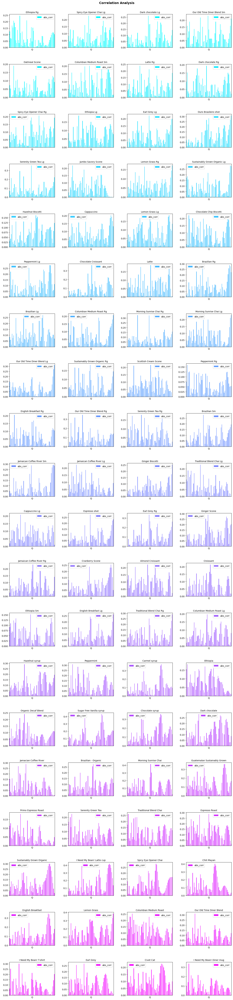

In [14]:
def detrendedY():
    products = coffee_sales["product_detail"].unique()
    dfs = dict()
    for prod in products:
        df = trend_results[0][prod].copy()
        df.columns = ["date", "Y", "ma", "Y1"]
        df["Y_det"] = df["Y"] - df["Y1"]
        dfs[prod] = df

    return dfs

Q = range(2, 61)

def cov(X, Y):
    A, B = np.array(X), np.array(Y)
    return np.mean(A *B) - np.mean(A) *np.mean(B)

def corr(X, Y):
    A, B = np.array(X), np.array(Y)
    return cov(A, B) / np.sqrt(cov(A, A) *cov(B, B))

def corr_analysis(Q, train_ratio= 0.8, N= 5):
    products = coffee_sales["product_detail"].unique()
    dfs = detrendedY()
    corr_dict = dict()

    for prod in products:
        df = dfs[prod].copy()
        df.reset_index(drop= True, inplace= True)
        df_train = df.loc[:int(train_ratio *len(df)), :].copy()
        df_valid = df.loc[
            [i for i in df.index if i not in df_train.index], :
        ].copy()
        w = lambda n: np.array([
            sum(
                [
                    np.sin(2 *np.pi *k *t / n)
                    + np.cos(2 *np.pi *k *t / n)
                    for k in range(N)
                    ]
                )
            for t in df_train.index
        ])
        one_min_abs_corr = pd.DataFrame(
            {
                "Q": Q,
                "abs_corr": [abs(corr(df_train["Y_det"], w(n))) for n in Q]
                }
        )
        corr_dict[prod] = one_min_abs_corr.copy()
    return corr_dict

def visualize_corr(Q, figsize= (18, 4 *20)):
    products = coffee_sales["product_detail"].unique()
    dfs_dict = corr_analysis(Q)
    fig, axs = plt.subplots(
        nrows= 20,
        ncols= 4,
        figsize= figsize
    )
    for k, prod in zip(range(len(products)), products):
        i, j = divmod(k, 4)
        df = dfs_dict[prod].copy()
        fig = df.plot(
            kind= "bar",
            x= "Q", y= "abs_corr",
            color= plt.cm.cool(k / (len(products) + 1)),
            xlabel= "Q",
            xticks= [],
            ax= axs[i][j],
            )
        axs[i][j].set_title(
            f"{prod}",
            fontsize= 10
        )
    fig = plt.subplots_adjust(hspace= 0.5, wspace= 0.3)
    fig = plt.suptitle(
        "Correlation Analysis",
        y= 0.89,
        weight= "bold",
        fontsize= 14
        )
    fig = plt.show()

visualize_corr(Q)

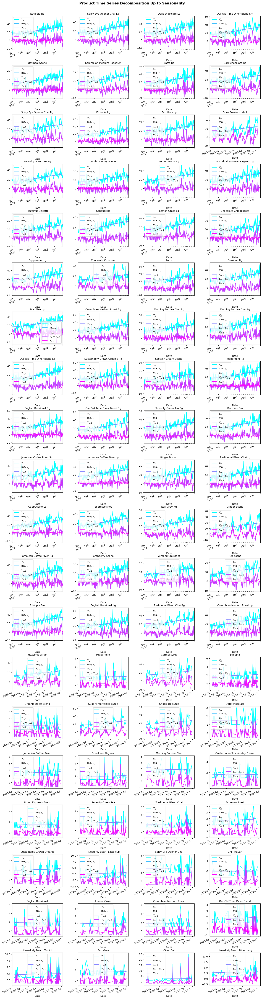

,product,Period,Coefficients,MAE_train,MAE_valid
0,Ethiopia Rg,15,"(0.0, -0.6392141269532855, 0.36269746146935855...",4.528869,7.321828
1,Spicy Eye Opener Chai Lg,28,"(0.0, -0.484685274695082, 2.145745072395427, 0...",4.551918,6.552099
2,Dark chocolate Lg,29,"(0.0, -0.3539051424251993, -0.0266516510987449...",5.334108,9.029752
3,Our Old Time Diner Blend Sm,30,"(0.0, -0.6850549125113087, 1.2137086571684161,...",5.379375,7.056533
4,Oatmeal Scone,7,"(0.0, -0.17056645147672794, -0.544369305192179...",2.153841,3.467209
...,...,...,...,...,...
75,Our Old Time Diner Blend,13,"(0.0, -0.06707282002865596, -0.115995796206779...",0.601651,0.941356
76,I Need My Bean! T-shirt,14,"(0.0, -0.07750756430935585, -0.204007482969960...",1.077869,1.999021
77,Earl Grey,22,"(0.0, -0.02310240901378069, -0.289172710353783...",0.609708,0.653981
78,Civet Cat,46,"(0.0, -0.37008120016176416, 0.5252062332009433...",1.464833,2.821986


In [15]:
def mae(X, Y):
    A, B = np.array(X), np.array(Y)
    return np.mean(np.abs(A - B))

def seasonality_computation(Q, train_ratio= 0.8, N= 5):
    products = coffee_sales["product_detail"].unique()
    corr_dict = corr_analysis(Q= Q, train_ratio= train_ratio, N= N)
    ts_dict = detrendedY()
    ts_result = dict()
    M_dict = dict()
    coeffs = dict()
    mae_train_dict = dict()
    mae_valid_dict = dict()

    for prod in products:
        df = corr_dict[prod].copy()
        ts = ts_dict[prod].copy()
        ts = ts.reset_index(drop= True)
        ts_train = ts.loc[:int(train_ratio *len(ts)), :].copy()
        ts_valid = ts.loc[
            [i for i in ts.index if i not in ts_train.index], :
        ].copy()
        M = list(df[df["abs_corr"] == df["abs_corr"].max()]["Q"])[0]

        X_train = pd.DataFrame()
        X_valid = pd.DataFrame()
        y_train = ts_train["Y_det"]
        y_valid = ts_valid["Y_det"]
        for k in range(N):
            X_train[f"sin{k}"] = [np.sin(2 *np.pi *k *t / M) for t in ts_train.index]
            X_train[f"cos{k}"] = [np.cos(2 *np.pi *k *t / M) for t in ts_train.index]

            X_valid[f"sin{k}"] = [np.sin(2 *np.pi *k *t / M) for t in ts_valid.index]
            X_valid[f"cos{k}"] = [np.cos(2 *np.pi *k *t / M) for t in ts_valid.index]

        model = LinearRegression(fit_intercept= False)
        model.fit(X_train, y_train)
        y_pred_train = model.predict(X_train)
        y_pred_valid = model.predict(X_valid)

        mae_train = mae(y_train, y_pred_train)
        mae_valid = mae(y_valid, y_pred_valid)

        ts["Y2"] = model.predict(
            pd.concat([X_train, X_valid], axis= 0, ignore_index= True)
            )
        ts_result[prod] = ts.copy()
        M_dict[prod] = M
        coeffs[prod] = tuple(model.coef_)
        mae_train_dict[prod] = mae_train
        mae_valid_dict[prod] = mae_valid

    func_info = pd.DataFrame(
        {
            "product": M_dict.keys(),
            "Period": M_dict.values(),
            "Coefficients": coeffs.values(),
            "MAE_train": mae_train_dict.values(),
            "MAE_valid": mae_valid_dict.values()
            }
    )

    return ts_result, func_info

seasonality_results = seasonality_computation(Q)

def visualize_Y2(figsize= (18, 4 *20)):
    products = coffee_sales["product_detail"].unique()
    dfs_dict = dict()
    for prod in products:
        dfs_dict[prod] = seasonality_results[0][prod].copy()

    fig, axs = plt.subplots(
        nrows= 20,
        ncols= 4,
        figsize= figsize
    )
    
    for k, prod in zip(range(len(products)), products):
        i, j = divmod(k, 4)

        df = dfs_dict[prod].copy()
        df.columns = [
            "date",
            r"$Y_\omega$",
            r"$\mathrm{ma}_{r, Y_\omega}$",
            r"$Y_{\omega, 1}$",
            r"$Y_\omega - Y_{\omega, 1}$",
            r"$Y_{\omega, 2}$"
            ]
        fig = df.set_index("date").plot(
            cmap= "cool",
            rot= 24,
            xlabel= "Date",
            ax= axs[i][j],
            )
        axs[i][j].set_title(
            f"{prod}",
            fontsize= 10
        )
    fig = plt.subplots_adjust(hspace= 0.5, wspace= 0.3)
    fig = plt.suptitle(
        "Product Time Series Decomposition Up to Seasonality",
        y= 0.89,
        weight= "bold",
        fontsize= 14
        )
    fig = plt.show()

visualize_Y2()
print("\n")
display(seasonality_results[1])

#### **Sales $\alpha_\omega$ Component**

Let us recall the LIE condition given by the expectation
$$
\forall \omega \in \Omega :\;
\mathrm{E}[Y_\omega] = \mathrm{E}[\hat{Y}_\omega]
$$
with respect to the probability space $(\tilde{T}, \tilde{\mathcal{T}}, P_\tilde{T})$. Since we have $Y_{\omega, 1}$ and $Y_{\omega, 2}$ in hand, then we can exploit the LIE condition to determine the component $\alpha_\omega$ by
\begin{align*}
\mathrm{E}[Y_\omega] &= \mathrm{E}[\hat{Y}_\omega] \\
\mathrm{E}[Y_{\omega, 1} + Y_{\omega, 2} + \varepsilon_\omega]
&= \mathrm{E}[Y_{\omega, 1} + Y_{\omega, 2} + \alpha_\omega] \\
\mathrm{E}[Y_{\omega, 1}] + \mathrm{E}[Y_{\omega, 2}] + \mathrm{E}[\varepsilon_\omega]
&= \mathrm{E}[Y_{\omega, 1}] + \mathrm{E}[Y_{\omega, 2}] + \mathrm{E}[\alpha_\omega] \\
\text{(since } \alpha_\omega \text{ is constant)}\quad
\therefore
\alpha_\omega
&= \mathrm{E}[\alpha_\omega]
= \mathrm{E}[\varepsilon_\omega] \,,
\end{align*}
for every $\omega \in \Omega$.

The computation for the $\{\alpha_\omega\}_{\omega \in \Omega}$ is presented as follows.

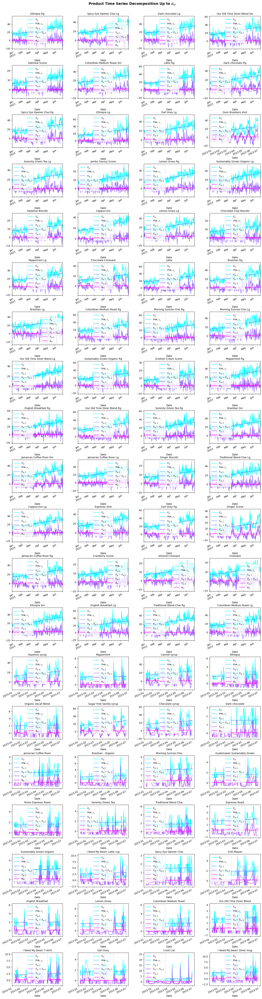

In [16]:
def compute_alpha_omega():
    products = coffee_sales["product_detail"].unique()
    dfs_dict = dict()

    for prod in products:
        df = seasonality_results[0][prod].copy()
        df.reset_index(drop= True, inplace= True)
        df["alpha"] = [np.mean(df["Y"] - df["Y1"] - df["Y2"])] *len(df)

        dfs_dict[prod] = df.copy()

    return dfs_dict

alpha_component_results = compute_alpha_omega()

def visualize_alpha(figsize= (18, 4 *20)):
    products = coffee_sales["product_detail"].unique()
    dfs_dict = alpha_component_results

    fig, axs = plt.subplots(
        nrows= 20,
        ncols= 4,
        figsize= figsize
    )

    for k, prod in zip(range(len(products)), products):
        i, j = divmod(k, 4)
        df = dfs_dict[prod].copy()
        df.columns = [
            "date",
            r"$Y_\omega$",
            r"$\mathrm{ma}_{r, Y_\omega}$",
            r"$Y_{\omega, 1}$",
            r"$Y_\omega - Y_{\omega, 1}$",
            r"$Y_{\omega, 2}$",
            r"$\alpha_\omega$"
            ]
        fig = df.set_index("date").plot(
            cmap= "cool",
            rot= 24,
            xlabel= "Date",
            ax= axs[i][j],
            )
        axs[i][j].set_title(
            f"{prod}",
            fontsize= 10
        )
    fig = plt.subplots_adjust(hspace= 0.5, wspace= 0.3)
    fig = plt.suptitle(
        r"Product Time Series Decomposition Up to $\alpha_\omega$",
        y= 0.89,
        weight= "bold",
        fontsize= 14
        )
    fig = plt.show()

visualize_alpha()

#### **Reconstruction of Sales Model**

Now that we have already determined $Y_{\omega, 1}, Y_{\omega, 2}, \alpha_\omega$, we can now construct the time series model of the sales by
\begin{align*}
\forall t \in T :\;
\hat{Y}(t)
&:= \alpha_\omega + Y_{\omega, 1}(t) + Y_{\omega, 2}(t) \\
&= \alpha_\omega + \left( \beta_{\omega, 0} + \beta_{\omega, 1} t \right) + \left( \sum_{k = 0}^{N_\omega} a_{\omega, k} \sin\left( \frac{2 \pi k t}{M_\omega} \right) + b_{\omega, k} \cos\left( \frac{2 \pi k t}{M_\omega} \right) \right)
\end{align*}
in which $\alpha_\omega, \beta_{\omega, 0}, \beta_{\omega, 1}, a_{\omega, 0}, \dotsc, a_{\omega, N_\omega}, b_{\omega, 0}, \dotsc, b_{\omega, N_\omega}, N_\omega, M_\omega$ have already been determined, for every $\omega \in \Omega$.

The visualization of the models are presented as follows.

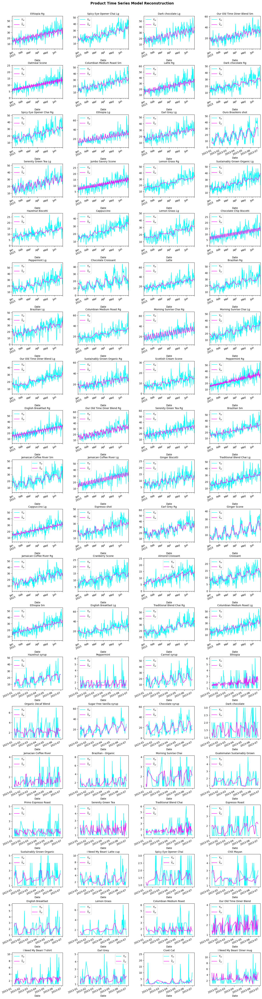

In [17]:
def reconstruct_model():
    products = coffee_sales["product_detail"].unique()
    dfs_dict = dict()

    for prod in products:
        df = alpha_component_results[prod].copy()
        df.reset_index(drop= True, inplace= True)
        df["Y_hat"] = df["alpha"] + df["Y1"] + df["Y2"]

        dfs_dict[prod] = df.copy()

    return dfs_dict

reconstruction_results = reconstruct_model()

def visulaize_hatY(figsize= (18, 4 *20)):
    products = coffee_sales["product_detail"].unique()
    dfs_dict = dict()

    for prod in products:
        df = reconstruction_results[prod].copy()
        df.columns = [
            "date",
            r"$Y_\omega$",
            r"$\mathrm{ma}_{r, Y_\omega}$",
            r"$Y_{\omega, 1}$",
            r"$Y_\omega - Y_{\omega, 1}$",
            r"$Y_{\omega, 2}$",
            r"$\alpha_\omega$",
            r"$\hat{Y}_\omega$"
            ]
        dfs_dict[prod] = df.copy()

    fig, axs = plt.subplots(
        nrows= 20,
        ncols= 4,
        figsize= figsize
    )

    for k, prod in zip(range(len(products)), products):
        i, j = divmod(k, 4)

        df = dfs_dict[prod].copy()
        fig = df.set_index("date").loc[
                :, [r"$Y_\omega$", r"$\hat{Y}_\omega$"]].plot(
            cmap= "cool",
            rot= 24,
            xlabel= "Date",
            ax= axs[i][j],
            )
        axs[i][j].set_title(
            f"{prod}",
            fontsize= 10
        )

    fig = plt.subplots_adjust(hspace= 0.5, wspace= 0.3)
    fig = plt.suptitle(
        r"Product Time Series Model Reconstruction",
        y= 0.89,
        weight= "bold",
        fontsize= 14
        )
    fig = plt.show()

visulaize_hatY()

### **4.2.3. Sales Forecast**

With the constructed models $\{\hat{Y}_\omega\}_{\omega \in \Omega}$, we will now forecast the sales of the products for 6 months ahead. Let $T_{fore} \subset T$ be the set consisting of dates for the 6 months ahead such that $T_{fore} \in \mathcal{T}$. The time-dependent forecast sales are given by
$$
\forall t \in T_{fore} :\;
\hat{Y}(t) = \alpha_\omega + Y_{\omega, 1}(t) + Y_{\omega, 2}(t) \,.
$$

The computation and visualization for the forecast is presented as follows.

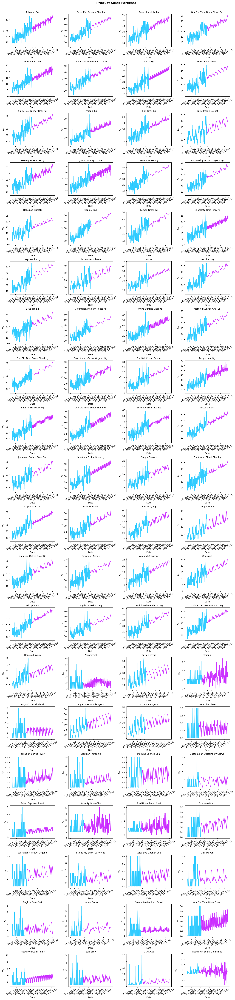

In [18]:
def model_function(prod):
    products = coffee_sales["product_detail"].unique()
    
    # alpha:
    alpha = alpha_component_results[prod]["alpha"].unique()[0]
    
    # beta_0, beta_1:
    b0, b1 = list(
        trend_results[1][
            trend_results[1]["product"] == prod
            ]["Trend Coefficients"]
        )[0]

    # Sinusoidal coeffcicients:
    coeffs = list(
        seasonality_results[1][seasonality_results[1]["product"] == prod]["Coefficients"]
        )[0]

    # Number of sinusoidal terms:
    N = int(len(coeffs) / 2)
    
    # Period:
    M = list(
        seasonality_results[1][seasonality_results[1]["product"] == prod]["Period"]
        )[0]

    # Returning the function model:
    return lambda t: alpha + b0 + b1 *t \
        + sum([coeffs[2 *k] *np.sin(2 *np.pi *k *t / M) for k in range(N)]) \
        + sum([coeffs[2 *k + 1] *np.cos(2 *np.pi *k *t / M) for k in range(N)])

def sales_forecast(fore_end):
    products = coffee_sales["product_detail"].unique()
    fore_ts = dict()
    for prod in products:
        df = reconstruction_results[prod].loc[:, ["date", "Y", "Y_hat"]].copy()
        df_fore = pd.DataFrame(
            {
                "date": pd.date_range(
                    start= df["date"].max(),
                    end= fore_end
                )
            }
        )
        df_fore["date"] = [d.strftime("%Y-%m-%d") for d in df_fore["date"]]
        df_fore.index = [i + df.index[-1] for i in df_fore.index]
        df_fore["Y_fore"] = [model_function(prod)(t) for t in df_fore.index]
        fore_ts[prod] = df_fore.copy()

    return fore_ts

sales_forecast_results = sales_forecast('2023-12-31')


def visualize_sales_forecast(figsize= (18, 4 *20)):
    products = coffee_sales["product_detail"].unique()

    fig, axs = plt.subplots(
        nrows= 20,
        ncols= 4,
        figsize= figsize
    )

    for k, prod in zip(range(len(products)), products):
        i, j = divmod(k, 4)

        df = reconstruction_results[prod].loc[:, ["date", "Y", "Y_hat"]].copy()
        df["date"] = [d.strftime("%Y-%m-%d") for d in df["date"]]
        df.columns = ["date", r"$Y_\omega$", r"$\hat{Y}_\omega$"]
        df_fore = sales_forecast_results[prod].copy()
#         df_fore["date"] = [d.strftime("%Y-%m-%d") for d in df_fore["date"]]
        df_fore.columns = ["date", r"$\hat{Y}_\omega$"]

        fig = sns.lineplot(
            data= df,
            x= "date",
            y= r"$Y_\omega$",
            color= plt.cm.cool(0.2),
            ax= axs[i][j]
        )
        fig = sns.lineplot(
            data= df_fore,
            x= "date",
            y= r"$\hat{Y}_\omega$",
            color= plt.cm.cool(0.8),
            ax= axs[i][j]
        )
        axs[i][j].set_title(
            f"{prod}",
            fontsize= 10
        )
        spacing = 30
        labels = list(df["date"])[:-1] + list(df_fore["date"])
        axs[i][j].set_xticks(labels[::spacing])
#         labels = [d.strftime("%Y-%m-%d") for d in labels]
        axs[i][j].set_xticklabels(labels[::spacing], rotation= 24)
        axs[i][j].set_xlabel("Date")

    fig = plt.subplots_adjust(hspace= 0.5, wspace= 0.3)
    fig = plt.suptitle(
        r"Product Sales Forecast",
        y= 0.89,
        weight= "bold",
        fontsize= 14
        )
    fig = plt.show()

visualize_sales_forecast()

### **4.2.4. Product Demands Forecast**

The product demand for the past 6 months is given in the total product sales as visualized earlier. Assuming that the coffee shop has the resource to provide the supply for the demand forecast of 6 months ahead, the demand forecast is estiamted from the forecast in Section 4.2.3. The exact value for the demand forecast can be given by the Lebesgue integral of $\hat{Y}_\omega$ with respect to measure $\kappa$ over $T_{fore}$, i.e.,
$$
\forall \omega \in \Omega :\;
F_{fore}(\omega) := \int_{T_{fore}} \hat{Y}_\omega \,\mathrm{d}\kappa \,,
$$
where $F_{fore}: \Omega \to \mathbb{R}$ represents the demand forecast, for every product $\omega \in \Omega$. On the other hand, the historical demand can be given by
$$
\forall \omega \in \Omega :\;
F_{hist}(\omega) := \int_{\tilde{T}} \hat{Y}_\omega \,\mathrm{d}\kappa \,.
$$

The exact values of both demand forecast ad the historical demand can be computed analytically, and are given in the following cell.

<Figure size 640x480 with 0 Axes>

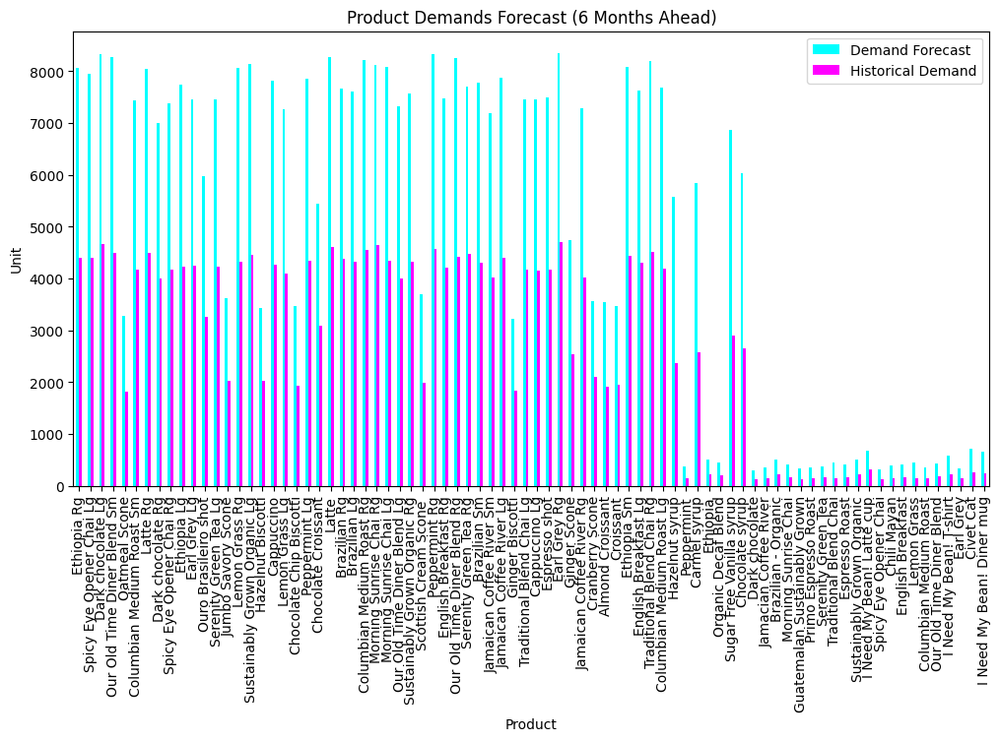

,Product,Demand Forecast,Historical Demand,Demand Growth
0,Ethiopia Rg,8064.676342,4393,0.835802
1,Spicy Eye Opener Chai Lg,7957.404036,4404,0.806858
2,Dark chocolate Lg,8320.201711,4668,0.782391
3,Our Old Time Diner Blend Sm,8279.758302,4484,0.846512
4,Oatmeal Scone,3279.382315,1820,0.801858
...,...,...,...,...
75,Our Old Time Diner Blend,424.525235,183,1.319810
76,I Need My Bean! T-shirt,578.853261,221,1.619246
77,Earl Grey,330.187333,142,1.325263
78,Civet Cat,709.301425,260,1.728082


In [19]:
def demand_forecast(visualize= False, figsize= (12, 6)):
    products = coffee_sales["product_detail"].unique()
    demand_fore_dict = dict()

    for prod in products:
        df_fore = sales_forecast_results[prod].copy()
        demand_fore_dict[prod] = df_fore["Y_fore"].sum()

    demand_fore_df = pd.DataFrame(
        {
            "Product": demand_fore_dict.keys(),
            "Demand Forecast": demand_fore_dict.values(),
            "Historical Demand": [
                coffee_sales[
                    coffee_sales["product_detail"] == prod
                    ]["transaction_qty"].sum()
                for prod in demand_fore_dict.keys()
                ]
            }
    )
    demand_fore_df["Demand Growth"] = (
        demand_fore_df["Demand Forecast"]
        - demand_fore_df["Historical Demand"]
        ) / demand_fore_df["Historical Demand"]
    
    if visualize == True:
        df_vis = demand_fore_df.copy()
        df_vis.drop(columns= ["Demand Growth"], inplace= True)
        fig = plt.figure()
        fig = df_vis.plot.bar(
            x= "Product",
            cmap= "cool",
            xlabel= "Product",
            ylabel= "Unit",
            figsize= figsize,
            title= "Product Demands Forecast (6 Months Ahead)"
        )
        fig = plt.show()
    else:
        return demand_fore_df

demand_forecast_results = demand_forecast(visualize= False).copy()

demand_forecast(visualize= True)
print("\n")
display(demand_forecast_results)

Now let us recall the measurable space $(\Omega, \mathcal{F})$. Let us now define a counting measure $\lambda: \mathcal{F} \to \mathbb{N}$ on $(\Omega, \mathcal{F})$. The demand forecast $F_{fore}: \Omega \to \mathbb{R}$ and the historical forecast $F_{hist}: \Omega \to \mathbb{R}$ are in fact $L^2$-functions with respect to $\lambda$, i.e., $F_{fore}, F_{hist} \in L^2(\lambda)$, since these functions are bounded everywhere on $\Omega$ and $\lambda$ is finite on $\Omega$, exactly $\lambda(\Omega) = 80$ as there are 80 products. Now let $F_{price}: \Omega \to \mathbb{R}$ be the price function with respect to the products. We will consider the latest prices for the image of $F_{price}$ since there are several price changes. Likewise, $F_{price} \in L^2(\lambda)$.

We will need to evaluate the revenue projection for 6 months ahead, which is given by
$$
R_{fore} := \int_{\Omega} F_{fore} F_{price} \,\mathrm{d}\lambda \,.
$$

On the other hand, we have also computed the growth of the demand with respect the historical demand. Let $G \in L^2(\lambda)$ be the measurable function representing the growth, and based on our computation, we have
$$
\forall \omega \in \Omega :\;
G(\omega) = \frac{F_{fore}(\omega) - F_{hist}(\omega)}{F_{hist}(\omega)} \,.
$$
Suppose a probability measure $P: \mathcal{F} \to [0, 1]$ on $(\Omega, \mathcal{F})$ defined by
$$
\forall A \in \mathcal{F} :\;
P(A) := \frac{\lambda(A)}{\lambda(\Omega)} \,.
$$
In this setting, $\frac{1}{\lambda(\Omega)}$ is the Radon-Nikodym derivative of $P$ with respect to $\lambda$ since $P \ll \lambda$ and
$$
\forall A \in \mathcal{F} :\;
P(A) = \frac{1}{\lambda(\Omega)} \int_{\Omega} \,\mathrm{d}\lambda \,.
$$
Note that $F_{fore}, F_{hist}, G \in L^2(P)$. The avergae demand growth of products is given by $\mathrm{E}[G]$.

The computation of projected revenue and the average product growth are presented as follows.

In [20]:
def revenue_projection():
    products = coffee_sales["product_detail"].unique()
    df = demand_forecast_results.copy()
    price_df = th_price().copy()
    df["Unit Price"] = price_df["Unit Prices"]
    unit_price_rev = list()

    for price in df["Unit Price"]:
        if type(price) == tuple:
            if len(price) == 2:
                _, p = price
                unit_price_rev.append(float(p))
            else:
                unit_price_rev.append(float(price[0]))
        else:
            unit_price_rev.append(float(price))

    df["Unit Price"] = unit_price_rev

    df["Projected Revenue"] = df["Demand Forecast"] *df["Unit Price"]
    
    return df.copy()

display(HTML(f"<b style='font-size:24px;'>Projected Revenue</b>"))
display(HTML(f"<b style='font-size:40px; color:deepskyblue'>{revenue_projection()['Projected Revenue'].sum():,.2f} USD</b>"))

print("\n")
display(HTML(f"<b style='font-size:24px;'>Product Average Growth</b>"))
display(HTML(f"<b style='font-size:40px; color:deepskyblue'>{revenue_projection()['Demand Growth'].mean() *100:,.2f} %</b>"))

# **5. Conclusion**

We have conducted the analysis on the Coffee Shop sales dataset including the Exploratory Data Analysis (EDA) and the Market Demand Analysis. We have employed a hybrid method for the time series analysis by incorporating probabilistic, statistical and machine learning approaches. The trends in the time series show convincing results while some of the seasonal components are not quite. For example, some time series models give a few negative values at a few time points which is irrelevant in terms of product sales. This phenomenon is caused by some less reliable seasonal components. However, since our goal is the aggregation of the forecast, we have made sure that aggregated sales have been captured in the model. Hence, our overall analysis is still reliable.

From the result of the analysis, most products have significant sales increase in the 6 months ahead (of the dataset) and only a few products have relatively less significant sales increase. Overall, the product sales increase with a projected revenue of **1,346,509.39 USD** and an average growth rate of **102.53%** in the 6 months ahead (of the dataset).

In addition, our analyses are based on formal mathematical theory with a systematic framework built upon followed by computational processes. This approach is intended to pose the beauty of interplay between abstract and computational mathematics applied to a practical case.

# **References**

[1] Salamon, D. A. (2016). *Measure and Integration*. EMS Press.

[2] Bremaud, P. (2020). *Probability Theory and Stochastic Processes*. Springer.

[3] Andre, R. (2024). *Point-Set Topology with Topics: Basic General Topology for Graduate Studies*. World Scientific Publication.